# Final code for xAI Paper:

An Explainable AI Approach for Interpreting Regionally Optimized Deep Neural Networks in Hydrological Prediction
F. Hosseini, C. Prieto, C. Álvarez

**Approach**

- This is the tutorial and steps:

        Step 01:  This is the code specifically to reproduce results of the current paper. It is important that there are two previous works that their results were used for this research. They can be found in:
        
        1- Hosseini, F., Prieto, C., & Álvarez, C. (2024a). Hyperparameter optimization of regional hydrological LSTMs by random search: A case study from Basque Country, Spain. Journal of Hydrology, 132003. doi: 10.1016/j.jhydrol.2024.132003

        2- Hosseini, F.; Prieto, C.; Álvarez, C. (2025). Ensemble learning of catchment-wise optimized LSTMs enhances regional rainfall-runoff modelling—Case Study: Basque Country, Spain. J. Hydrol. 132269. doi: 10.1016/j.jhydrol.2024.132269

        Step 02:  Here, we studied the outcomes of training several optimized regional LSTMs in Basque Country from a hydrological perspective. We tried to interpret the performance of optimized LSTMs in the case study. To do this we developed a regorous method that in the current paper is stated. This code is to reproduce the results of this paper.


In [1]:
"""
=================== Import required libraries ===================
"""
import csv
import ast
import os
import shap
import yaml
import pickle
import shutil
import random
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from adjustText import adjust_text
from matplotlib import colors
from pathlib import Path
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from matplotlib.transforms import blended_transform_factory
from pandas.plotting import parallel_coordinates
from sklearn.model_selection import ParameterGrid, ParameterSampler


c:\Users\hosseinifh\AppData\Local\anaconda3\envs\MyPythonLab\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
"""
================== read the CSV file for the test_DATASET of optimized regional LSTMs on URA chatchments ==================
"""

# Define the parent directory that contains the folders with config files
parent_dir = Path(r'~\data')

# Set the directory for the results
results_dir = Path(r'~\Results')

# Load the data into a pandas DataFrame with column names
df = pd.read_csv(parent_dir / "test_DATASET.csv", skiprows=[0], 
                     names=['Seq_1D',	'Seq_1H',	'batch_size',	'target_noise_std',	'Lr0',	'Lr10',	'Lr25',	
                            'loss',	'hidden_size',	'output_dropout',	'initial_forget_bias',	'regularization',	
                            'seed',	'Model',	'basin',	'freq',	'SF_NSE',	'WL_NSE',	'SF_KGE',	'WL_KGE',	'SF_MSE',	
                            'WL_MSE',	'SF_RMSE',	'WL_RMSE',	'SF_Alpha-NSE',	'WL_Alpha-NSE',	'SF_Beta-NSE',	'WL_Beta-NSE',	
                            'SF_Pearson-r',	'WL_Pearson-r',	'SF_Beta-KGE',	'WL_Beta-KGE',	'SF_FHV',	'WL_FHV',	
                            'SF_FMS',	'WL_FMS',	'SF_FLV',	'WL_FLV',	'SF_Peak-Timing',	'WL_Peak-Timing',	
                            'SF_Peak-MAPE',	'WL_Peak-MAPE',	'SF_Missed-Peaks',	'WL_Missed-Peaks',	'Config',
                            'Area',	'CONF_DEN',	'GRADIENT',	'max slope',	'mean slope',	'elevation',	'min hight',	'max hight',
                            'UHD',	'AGR',	'PAS',	'BLF',	'CNF',	'PLT',	'SSH',	'WAE',	'DEN',	'calc',	'cong',	'sdim',	'vlc',	'watr',
                            'conductivity',	'permeability',	'rock hardness',	'no. prec stations',	'no. temp stations',	
                            'possible snow',	'no. days with negative temp',	'mean runoff coff.',	'aridity index',
                            'mean precipitation',	'mean streamflow',	'mean  temperature',	'min  temperature',	'max temperature',	'coff. var. Prec',	'coff. var. Flow',	'mean PET']).fillna(0)
		
# TO replace 'column_name' with the actual name of the basin column
column_name = 'basin'

# Get unique basin names
unique_basins = df[column_name].unique()

# Create a dictionary mapping basin names to numbers
basin_to_number = {basin: i + 1 for i, basin in enumerate(unique_basins)}

# Add a new column 'basin_number' based on the mapping
df['BasinCode'] = df[column_name].map(basin_to_number)

df.head()

,Seq_1D,Seq_1H,batch_size,target_noise_std,Lr0,Lr10,Lr25,loss,hidden_size,output_dropout,...,aridity index,mean precipitation,mean streamflow,mean temperature,min temperature,max temperature,coff. var. Prec,coff. var. Flow,mean PET,BasinCode
0,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,1.305248,741.690281,241.314633,11.057215,-9.911061,39.288004,4.449241,2.579526,0.110513,1
1,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.816274,1172.193311,718.956138,13.514304,-4.257477,38.141637,3.372578,2.200887,0.109227,2
2,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.768765,1218.851932,874.629215,13.330600,-5.804744,38.778846,3.796338,1.989629,0.106965,3
3,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.673414,1413.344490,886.671777,12.997162,-5.897667,37.571000,3.633492,2.264974,0.108649,4
4,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.654248,1421.334652,619.600469,12.281695,-17.300000,38.133333,3.835466,1.820112,0.106154,5


In [3]:
# Drop columns that start with 'WL_'
df = df[df.columns.drop(list(df.filter(regex='^WL_')))]

df.head()

,Seq_1D,Seq_1H,batch_size,target_noise_std,Lr0,Lr10,Lr25,loss,hidden_size,output_dropout,...,aridity index,mean precipitation,mean streamflow,mean temperature,min temperature,max temperature,coff. var. Prec,coff. var. Flow,mean PET,BasinCode
0,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,1.305248,741.690281,241.314633,11.057215,-9.911061,39.288004,4.449241,2.579526,0.110513,1
1,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.816274,1172.193311,718.956138,13.514304,-4.257477,38.141637,3.372578,2.200887,0.109227,2
2,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.768765,1218.851932,874.629215,13.330600,-5.804744,38.778846,3.796338,1.989629,0.106965,3
3,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.673414,1413.344490,886.671777,12.997162,-5.897667,37.571000,3.633492,2.264974,0.108649,4
4,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.654248,1421.334652,619.600469,12.281695,-17.300000,38.133333,3.835466,1.820112,0.106154,5


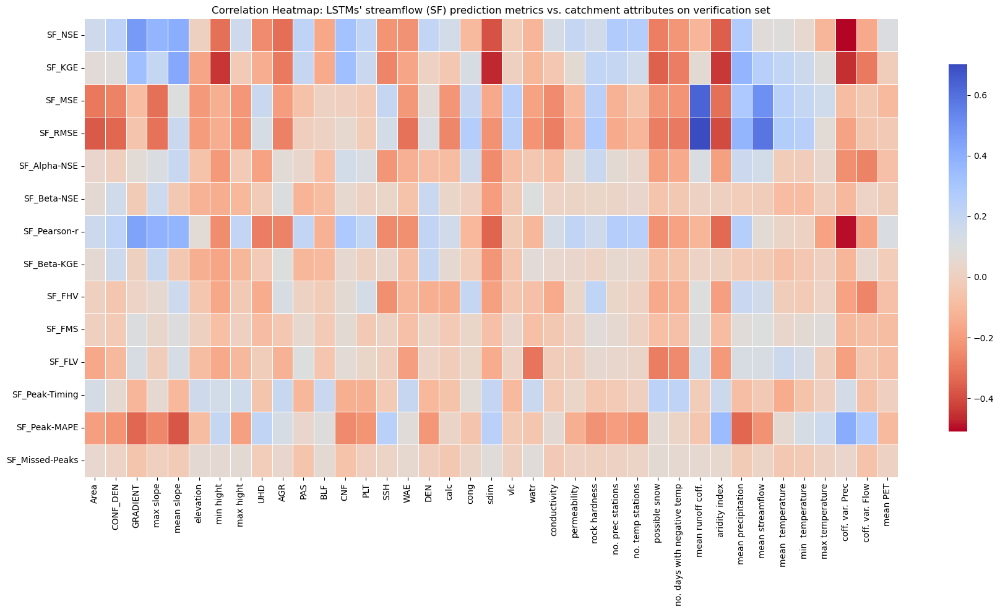

Correlations higher than 0.3 have been saved to 'high_correlations.xlsx'


In [4]:
"""
Correlations between catchment attributes and verification metrics for the best performing models on both local and regional scale
"""

cols11 = ['Area',	'CONF_DEN',	'GRADIENT',	'max slope',	'mean slope',	'elevation',	'min hight',	'max hight',
                            'UHD',	'AGR',	'PAS',	'BLF',	'CNF',	'PLT',	'SSH',	'WAE',	'DEN',	'calc',	'cong',	'sdim',	'vlc',	'watr',
                            'conductivity',	'permeability',	'rock hardness',	'no. prec stations',	'no. temp stations',	
                            'possible snow',	'no. days with negative temp',	'mean runoff coff.',	'aridity index',
                            'mean precipitation',	'mean streamflow',	'mean  temperature',	'min  temperature',	'max temperature',	'coff. var. Prec',	'coff. var. Flow',	'mean PET']

col_obj = ['SF_NSE',	'SF_KGE',	'SF_MSE',	
           'SF_RMSE',	'SF_Alpha-NSE',	'SF_Beta-NSE',	
           'SF_Pearson-r',	'SF_Beta-KGE',	'SF_FHV',	
           'SF_FMS',	'SF_FLV',	'SF_Peak-Timing',	
           'SF_Peak-MAPE',	'SF_Missed-Peaks']

col_num = cols11  # Use cols3 or any other group of catchment attributes you want to correlate with metrics

# Concatenate DataFrames to combine the columns of interest
obj_df = pd.concat([df[col_obj], df[col_num]], axis=1)

# Calculate the correlation matrix, ensuring to drop NaN values first
correlation_matrix = obj_df.corr()

# Filter correlation matrix for the relevant columns
filtered_corr = correlation_matrix.loc[col_obj, col_num]

# Create a larger figure to ensure all annotations fit properly
plt.figure(figsize=(18, 10))  # Adjust figure size as needed

# Create a heatmap with annotations
ax = sns.heatmap(filtered_corr, annot=False, cmap='coolwarm_r', fmt=".1f", 
                 linewidths=0.5, annot_kws={"size": 8},  # Adjust annotation size
                 cbar_kws={'shrink': .8})  # Shrink color bar to fit

plt.title("Correlation Heatmap: LSTMs' streamflow (SF) prediction metrics vs. catchment attributes on verification set")

# Rotate Y-axis labels for readability (or adjust as needed)
plt.yticks(rotation=0)

# Automatically adjust subplot parameters for better fit
plt.tight_layout()

# Save the figure as a high-quality PNG file
plt.savefig(results_dir / 'Correlation.pdf', dpi=300, format='pdf')

# Show the heatmap
plt.show()

# Filter correlations higher than 0.3 (absolute values)
high_corr = filtered_corr[(filtered_corr.abs() > 0.3)]

# Drop rows and columns where all values are NaN
high_corr = high_corr.dropna(how='all', axis=0).dropna(how='all', axis=1)

# Flatten the DataFrame and reset index to create a table format
high_corr_table = high_corr.stack().reset_index()

# Rename columns for better readability
high_corr_table.columns = ['Metric', 'Attribute', 'Correlation']

# Sort values by the highest correlation
high_corr_table = high_corr_table.sort_values(by='Correlation', ascending=False)

# Save the table to an Excel file
high_corr_table.to_excel(results_dir / 'high_correlations.xlsx', index=False)

print("Correlations higher than 0.3 have been saved to 'high_correlations.xlsx'")

In [ ]:
# Drop columns that match any of the specified patterns for better visibility of plots for paper
df2 = df[df.columns.drop(list(df.filter(regex='SF_MSE|SF_FMS|SF_FLV|SF_Peak-Timing')))]

df2.head()

,Seq_1D,Seq_1H,batch_size,target_noise_std,Lr0,Lr10,Lr25,loss,hidden_size,output_dropout,...,aridity index,mean precipitation,mean streamflow,mean temperature,min temperature,max temperature,coff. var. Prec,coff. var. Flow,mean PET,BasinCode
0,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,1.305248,741.690281,241.314633,11.057215,-9.911061,39.288004,4.449241,2.579526,0.110513,1
1,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.816274,1172.193311,718.956138,13.514304,-4.257477,38.141637,3.372578,2.200887,0.109227,2
2,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.768765,1218.851932,874.629215,13.330600,-5.804744,38.778846,3.796338,1.989629,0.106965,3
3,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.673414,1413.344490,886.671777,12.997162,-5.897667,37.571000,3.633492,2.264974,0.108649,4
4,365,504,64,0.05,0.001,0.001,0.001,1,32,0.2,...,0.654248,1421.334652,619.600469,12.281695,-17.300000,38.133333,3.835466,1.820112,0.106154,5


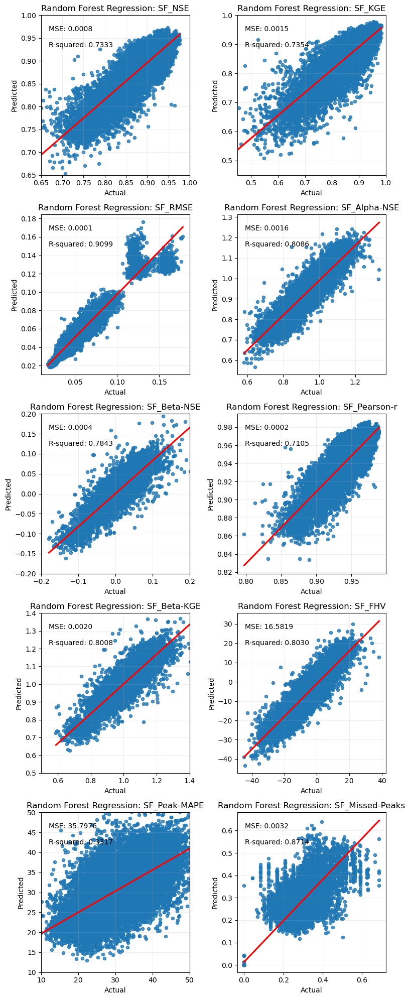

In [ ]:
## This code applies Random Forests  on test_DATSAET for LSTM on URA chatchments for different metrics
#  Each RF model receives hyperparameters of the optimized regional LSTMs and catchments attributes and predicts the performance of model in different locations.

# Define the target variables to plot
target_variables = ['SF_NSE',	'SF_KGE',	
                    'SF_RMSE',	'SF_Alpha-NSE',	'SF_Beta-NSE',	
                    'SF_Pearson-r',	'SF_Beta-KGE',	'SF_FHV',	
                    'SF_Peak-MAPE',	'SF_Missed-Peaks']

# Create a DataFrame to store feature importance values
feature_importance_df = pd.DataFrame(index=df2.drop(columns=['Model', 'basin', 'freq', 'SF_NSE',	'SF_KGE',	
                                                            'SF_RMSE',	'SF_Alpha-NSE',	'SF_Beta-NSE',	
                                                            'SF_Pearson-r',	'SF_Beta-KGE',	'SF_FHV',	
                                                            'SF_Peak-MAPE',	'SF_Missed-Peaks', 'Config', 'BasinCode']).columns)

# Set up subplots for a 2x2 grid (2 subplots)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(8, 20))
fig.subplots_adjust(hspace=0.4)  # Adjust vertical spacing between subplots

# Create a DataFrame to store feature importance values
feature_importance_df = pd.DataFrame(index=df2.drop(columns=['Model', 'basin', 'freq', 'SF_NSE',	'SF_KGE',	
                                                            'SF_RMSE',	'SF_Alpha-NSE',	'SF_Beta-NSE',	
                                                            'SF_Pearson-r',	'SF_Beta-KGE',	'SF_FHV',	
                                                            'SF_Peak-MAPE',	'SF_Missed-Peaks', 'Config', 'BasinCode']).columns)

# Initialize a dictionary to store the models
rf_models = {}

# Loop through each target variable and create a scatterplot with a regression line
for i, target_var in enumerate(target_variables):
    row = i // 2  # Determine the row for the subplot
    col = i % 2   # Determine the column for the subplot
    
    # Split data into training and testing sets for the current target variable
    X_train, X_test, y_train, y_test = train_test_split(
        df2.drop(columns=['Model', 'basin', 'freq', 'SF_NSE', 'SF_KGE', 'SF_RMSE', 'SF_Alpha-NSE', 
                          'SF_Beta-NSE', 'SF_Pearson-r', 'SF_Beta-KGE', 'SF_FHV', 'SF_Peak-MAPE', 
                          'SF_Missed-Peaks', 'Config', 'BasinCode']).astype(float), 
        df2[target_var], 
        test_size=0.3, 
        random_state=42
    )

    # Instantiate Random Forest Regression object and fit to training data
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)

    # Store the model in the dictionary with the target variable as the key
    rf_models[target_var[3:]] = rf_model

    # Make predictions on test data
    y_pred = rf_model.predict(X_test)

    # Create scatter plot of predicted versus actual values with regression line
    ax = axes[row, col]
    sns.regplot(x=y_test, y=y_pred, ax=ax, scatter_kws={"s": 20}, line_kws={"color": "red"})
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'Random Forest Regression: {target_var}')
    ax.grid(alpha=0.2)

    if row == 0 and col == 0:
        ax.set_xlim(0.65, 1)
        ax.set_ylim(0.65, 1)
    elif row == 0 and col == 1:
        ax.set_xlim(0.45, 1)
        ax.set_ylim(0.45, 1)
    elif row == 2 and col == 0:
        ax.set_xlim(-0.2, 0.2)
        ax.set_ylim(-0.2, 0.2)
    elif row == 3 and col == 0:
        ax.set_xlim(0.5, 1.4)
        ax.set_ylim(0.5, 1.4)
    elif row == 4 and col == 0:
        ax.set_xlim(10, 50)
        ax.set_ylim(10, 50)

    # Calculate MSE and R-squared
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Add MSE and R-squared to the plot
    ax.text(0.05, 0.9, f'MSE: {mse:.4f}', transform=ax.transAxes, fontsize=10)
    ax.text(0.05, 0.8, f'R-squared: {r2:.4f}', transform=ax.transAxes, fontsize=10)

    # Extract feature importance and add to the DataFrame
    feature_importance = rf_model.feature_importances_
    feature_importance_df[target_var] = feature_importance

# Adjust layout for better appearance
plt.tight_layout()

# Save the figure as a high-quality PNG file
plt.savefig(results_dir / 'test_DATASET_Random_Forest_HPs&Attributes&Basincode.pdf', dpi=300, format='pdf')

# Show the combined plot
plt.show()



C:\Users\hosseinifh\AppData\Local\Temp\ipykernel_21920\2195086844.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_features, x=top_features.index, y=col_name, palette=color_palette, ax=ax)
C:\Users\hosseinifh\AppData\Local\Temp\ipykernel_21920\2195086844.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(top_features.index, rotation=45, ha='right', fontsize=10)
C:\Users\hosseinifh\AppData\Local\Temp\ipykernel_21920\2195086844.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_features, x=top_features.index, y=col_name, palette=color_palette, ax=ax)
C:\Users\hosse

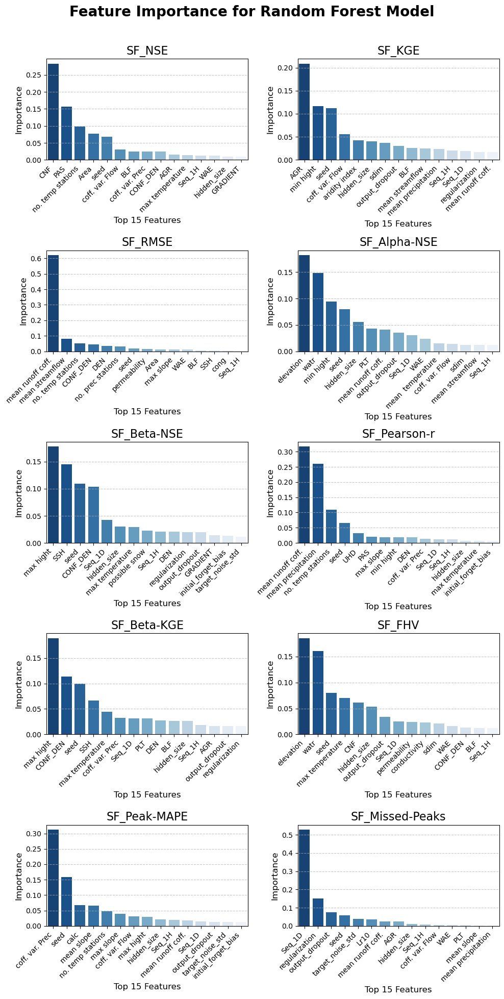

In [ ]:
## This code plots feature importance of the Random Forest applied on test_DATASET for MTS-LSTM on URA catchments regarding their Catchments attributes
# It focuses on predicting different catchments' performance metrics based on their attributes

# Select the top features for each target variable
def get_top_features(df2, target, num_features=15): # for better visibility we only focus on 15 top features for every RF model
    return df2.nlargest(num_features, target)[[target]]

# List of target variables for plotting
target_vars = [
                    'SF_NSE',	'SF_KGE',	
                    'SF_RMSE',	'SF_Alpha-NSE',	'SF_Beta-NSE',	
                    'SF_Pearson-r',	'SF_Beta-KGE',	'SF_FHV',	
                    'SF_Peak-MAPE',	'SF_Missed-Peaks'
]

# Create subplots with 7 rows and 2 columns (14 subplots)
fig, axs = plt.subplots(5, 2, figsize=(10, 21))
fig.suptitle('Feature Importance for Random Forest Model', fontsize=20, fontweight='bold', y=0.93)

# Define a color palette for the plots
color_palette = sns.color_palette("Blues_r", 15)

# Plot function to handle feature importance for each target variable
def plot_feature_importance(ax, top_features, col_name, title):
    # Create a simple bar plot for the top features
    sns.barplot(data=top_features, x=top_features.index, y=col_name, palette=color_palette, ax=ax)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Top 15 Features', fontsize=12)
    ax.set_ylabel('Importance', fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.set_xticklabels(top_features.index, rotation=45, ha='right', fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Create a dictionary to store the top features for all target variables
top_features_dict = {}

# Loop through each target variable and plot the top features
for i, target_var in enumerate(target_vars):
    row, col = divmod(i, 2)  # Calculate row and column position for each plot
    top_features = get_top_features(feature_importance_df, target_var)
    top_features_dict[target_var] = top_features  # Store in the dictionary
    plot_feature_importance(axs[row, col], top_features, target_var, f'{target_var}')

# Concatenate all top features into a single DataFrame
top_features_table = pd.concat(top_features_dict, axis=1)

# Save feature importance table to an Excel file
top_features_table.to_excel(results_dir / 'Random_Forest_Feature_Importance.xlsx')

# Adjust layout for better appearance
plt.tight_layout(rect=[0, 0, 1, 0.92])  # Adjust for suptitle

# Save the figure as a high-quality TIFF file
plt.savefig(results_dir / 'Random_Forest_Feature_Importance_HPs&Attributes&Basincode.pdf', dpi=300, format='pdf')

# Show the combined plot
plt.show()


SHAP (SHapley Additive exPlanations) value plots for xAI interpretation of RF models

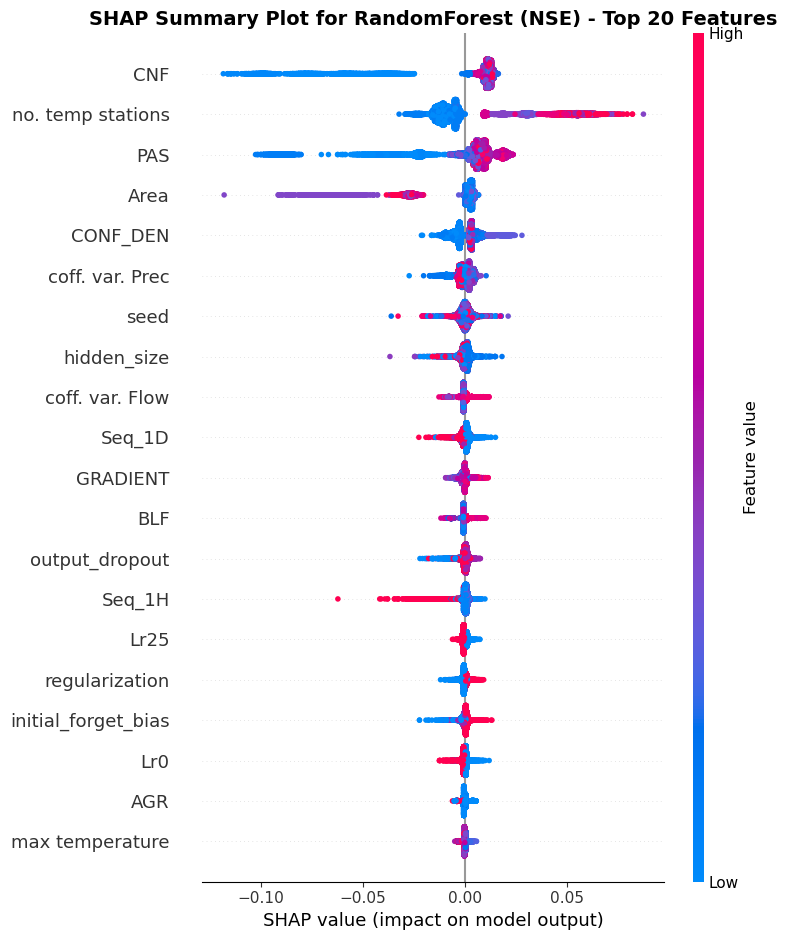

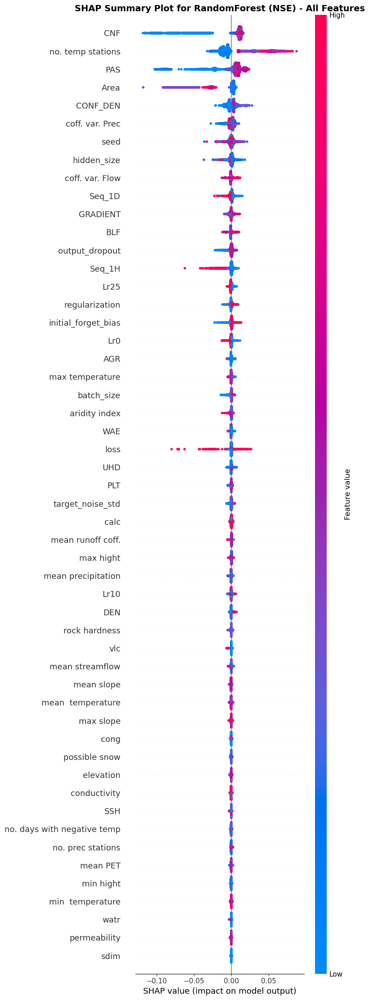

In [ ]:
## SHAP plots for NSE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'NSE'
rf=rf_models['NSE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


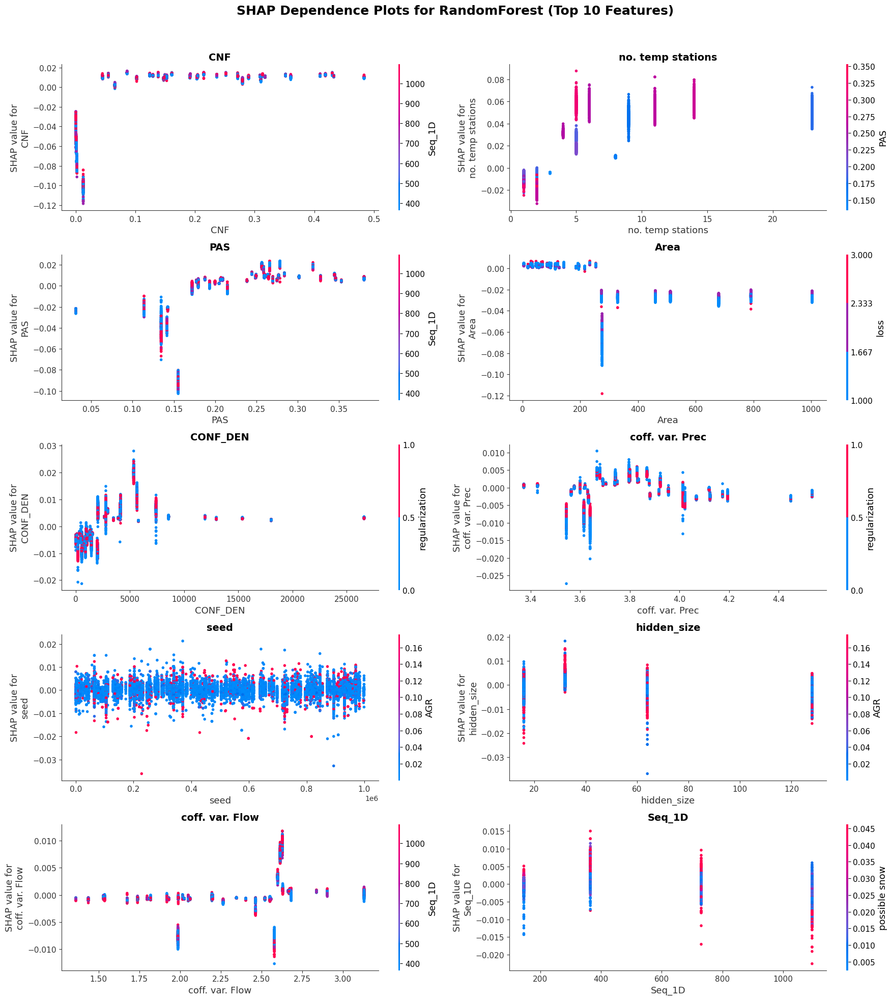

In [22]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()


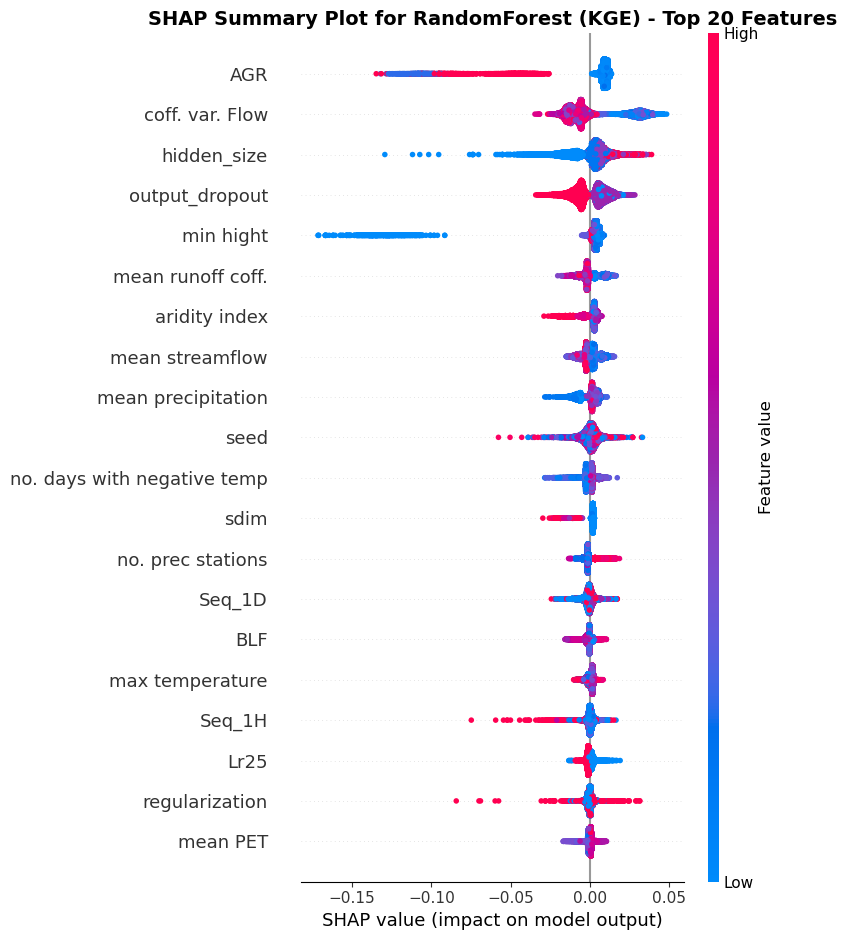

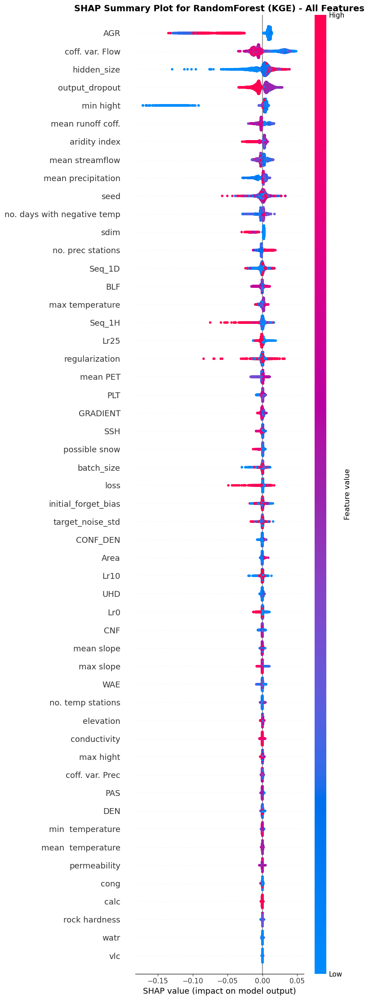

In [ ]:
## SHAP Plots for KGE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'KGE'
rf=rf_models['KGE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


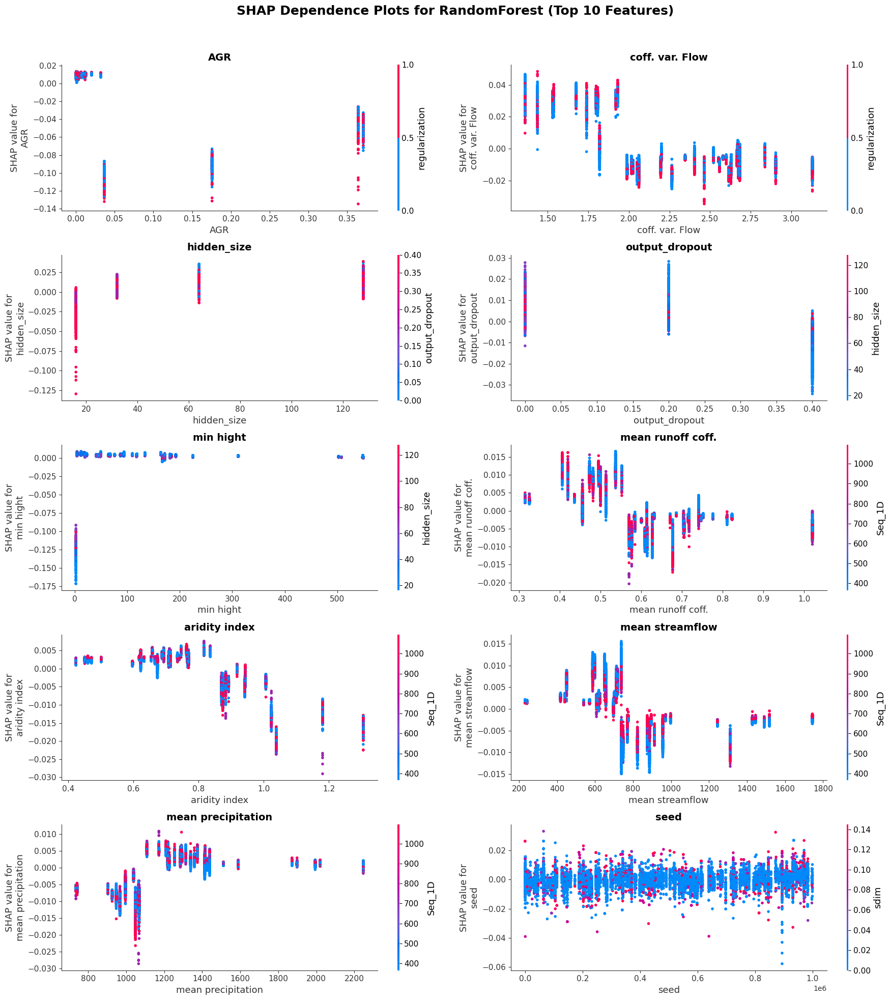

In [24]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()


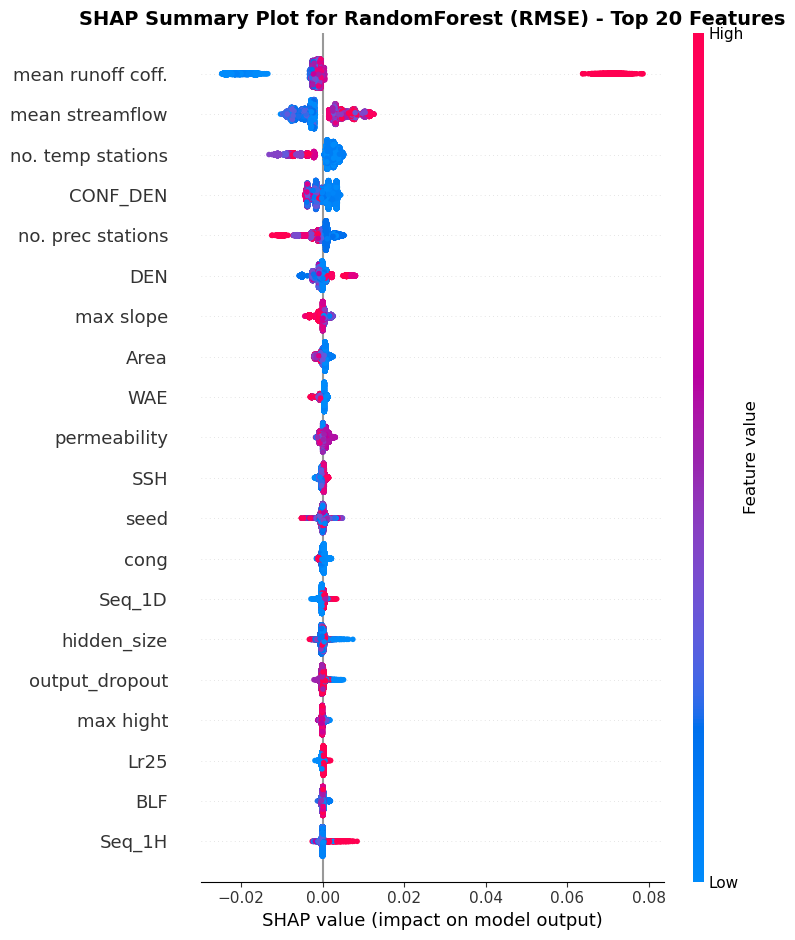

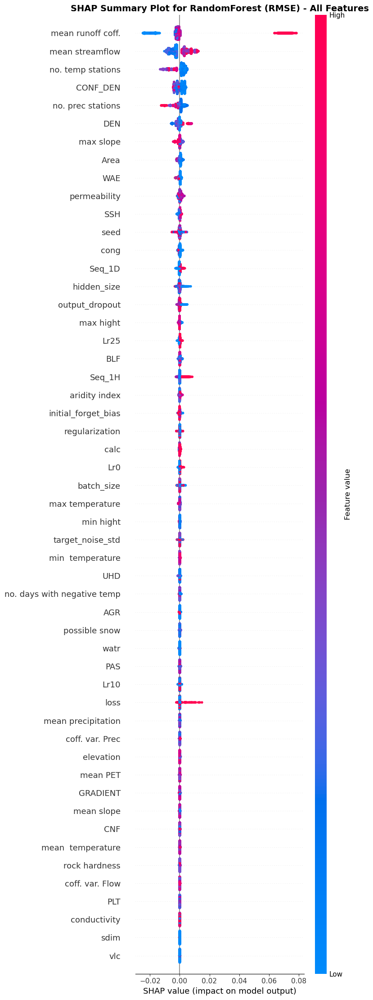

In [ ]:
## SHAP plots for RMSE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'RMSE'
rf=rf_models['RMSE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

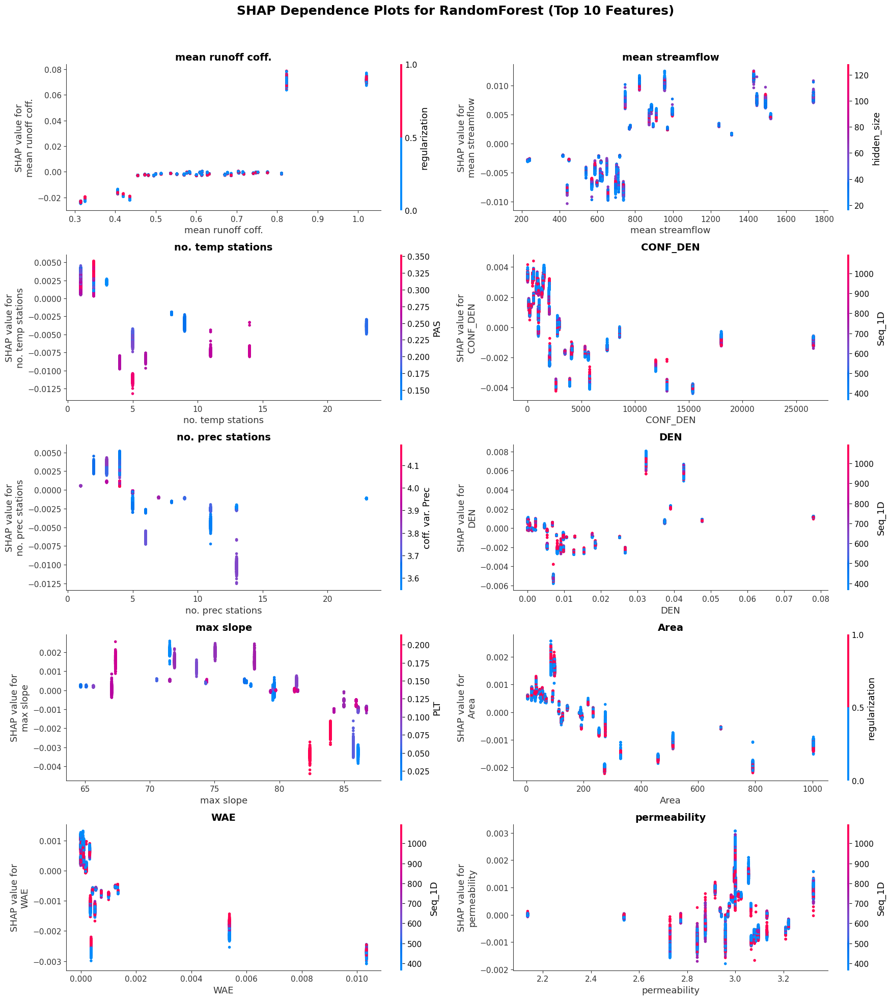

In [26]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

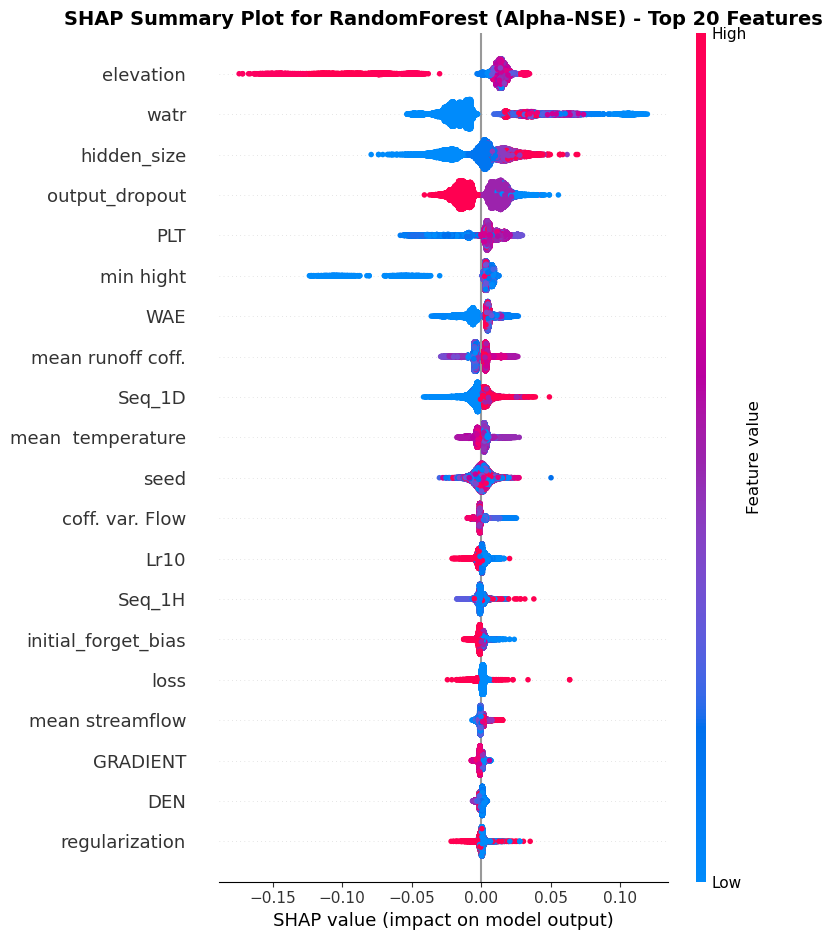

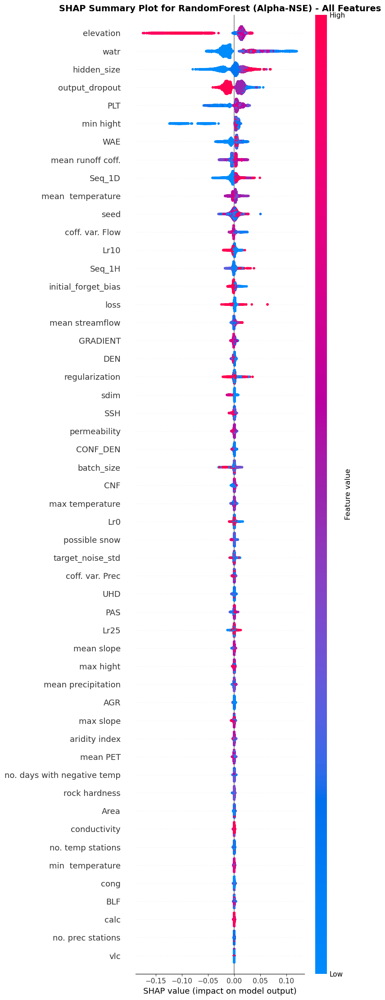

In [ ]:
## SHAP plot for Alpha-NSE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'Alpha-NSE'
rf=rf_models['Alpha-NSE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

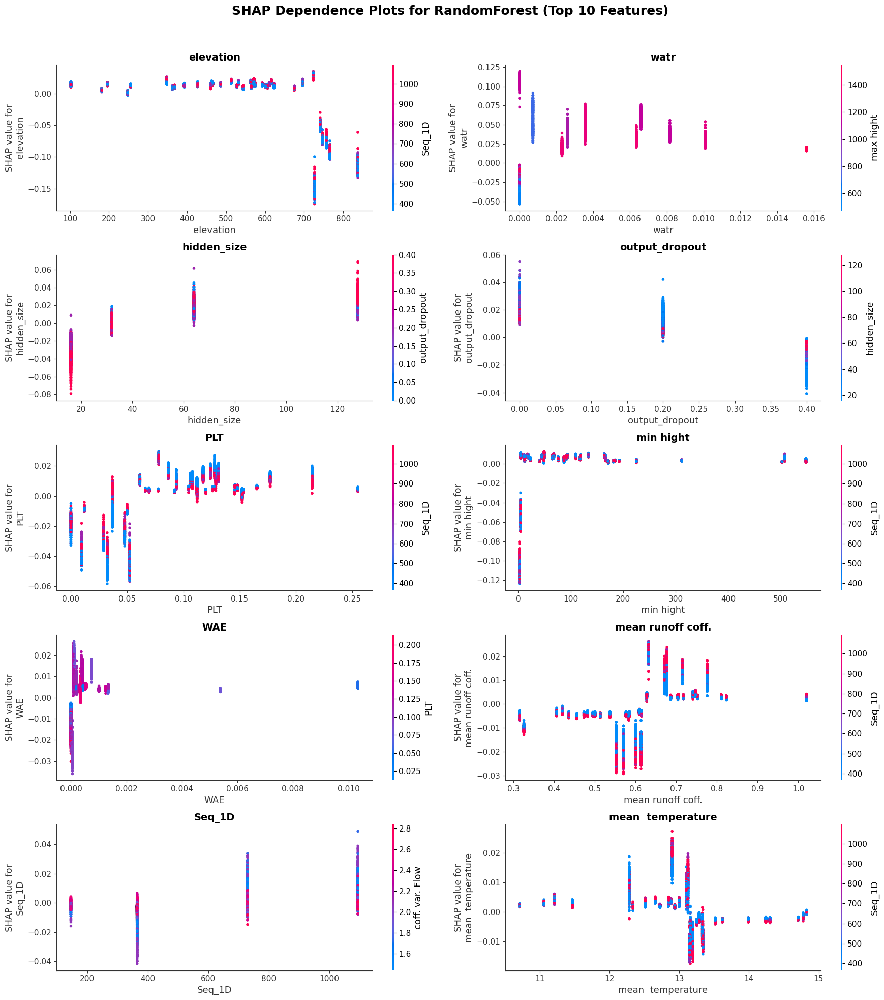

In [28]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

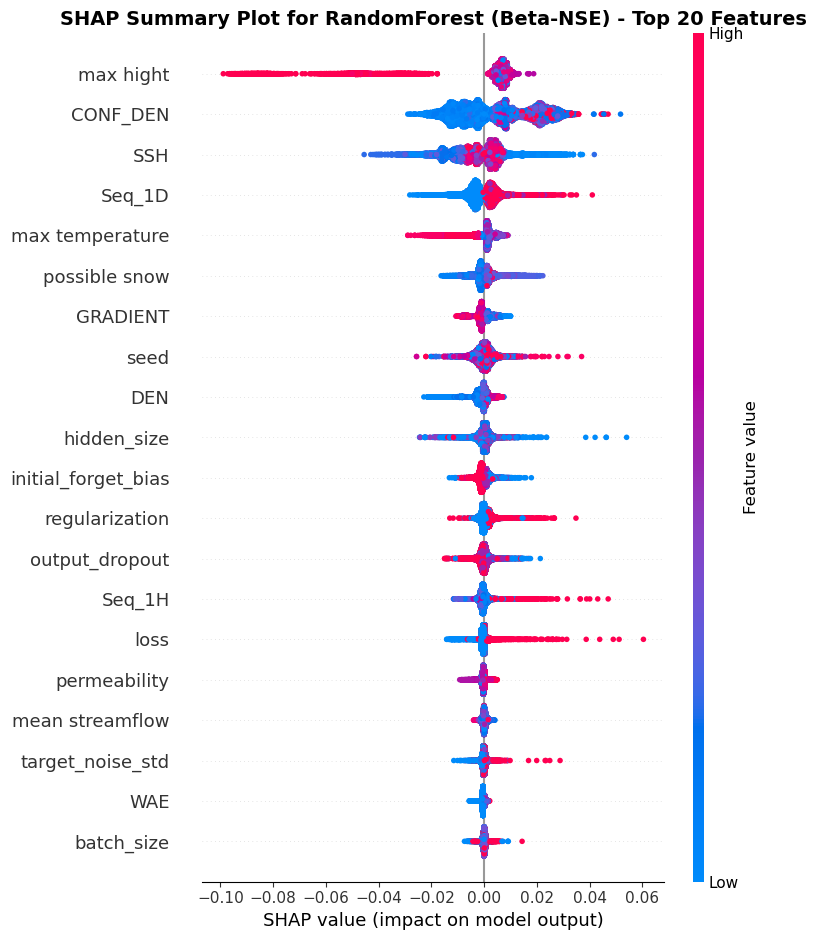

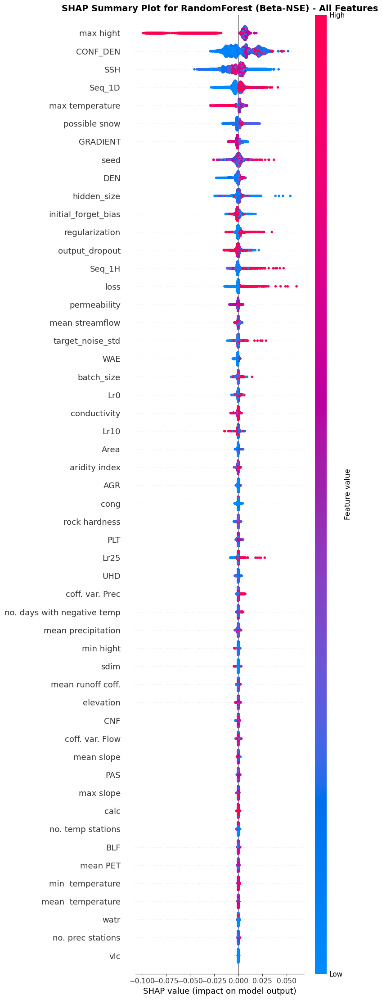

In [ ]:
## SHAP plots for Beta-NSE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'Beta-NSE'
rf=rf_models['Beta-NSE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

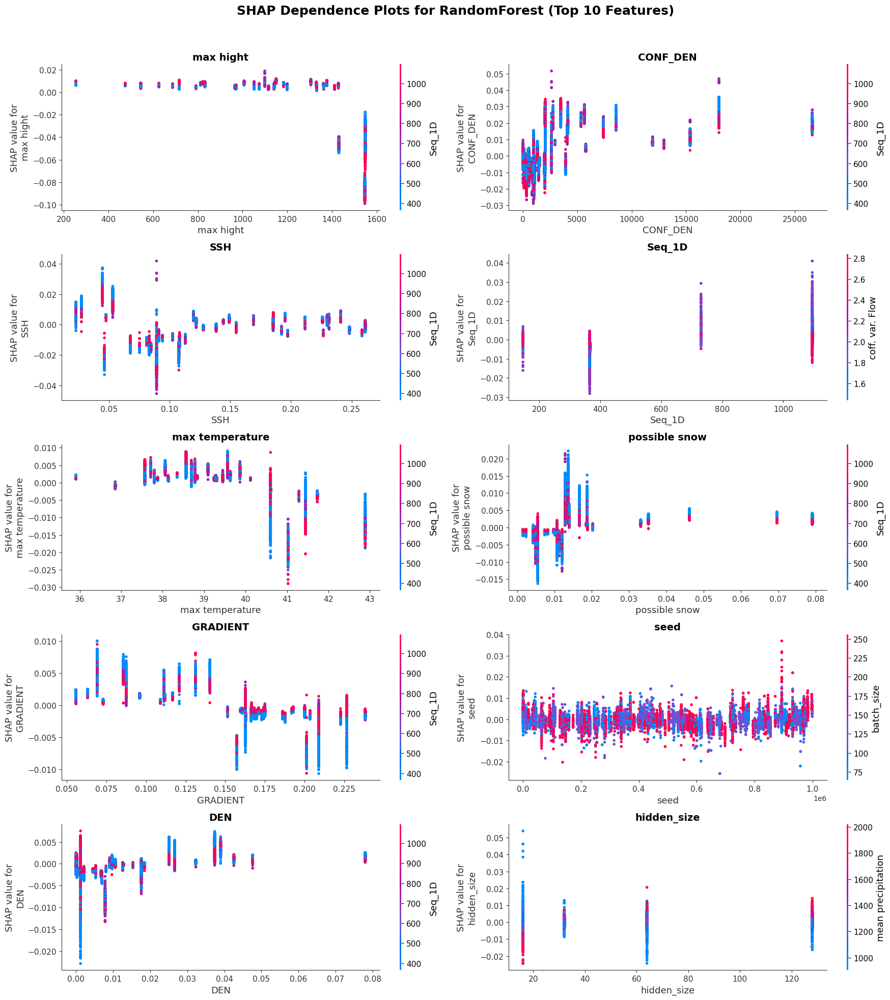

In [30]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

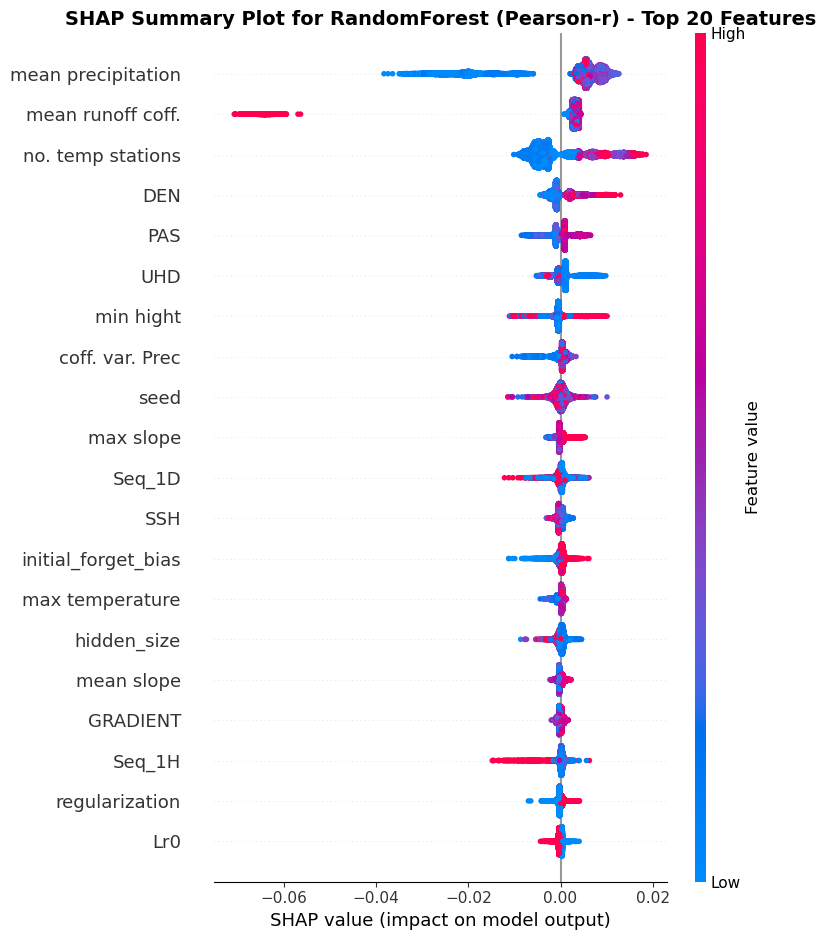

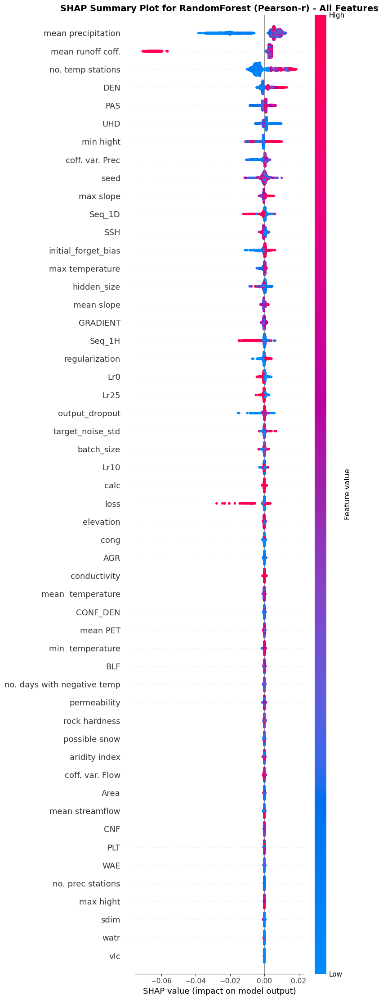

In [ ]:
## SHAP plots for Pearson-r metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'Pearson-r'
rf=rf_models['Pearson-r']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

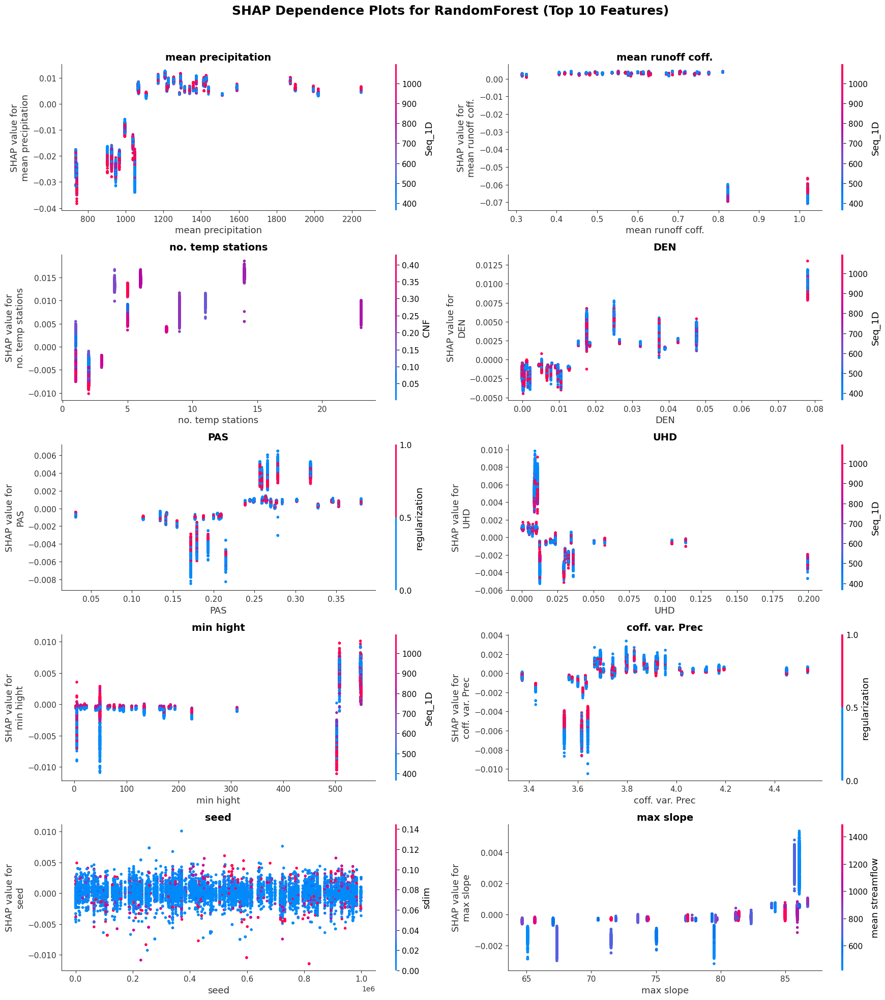

In [32]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

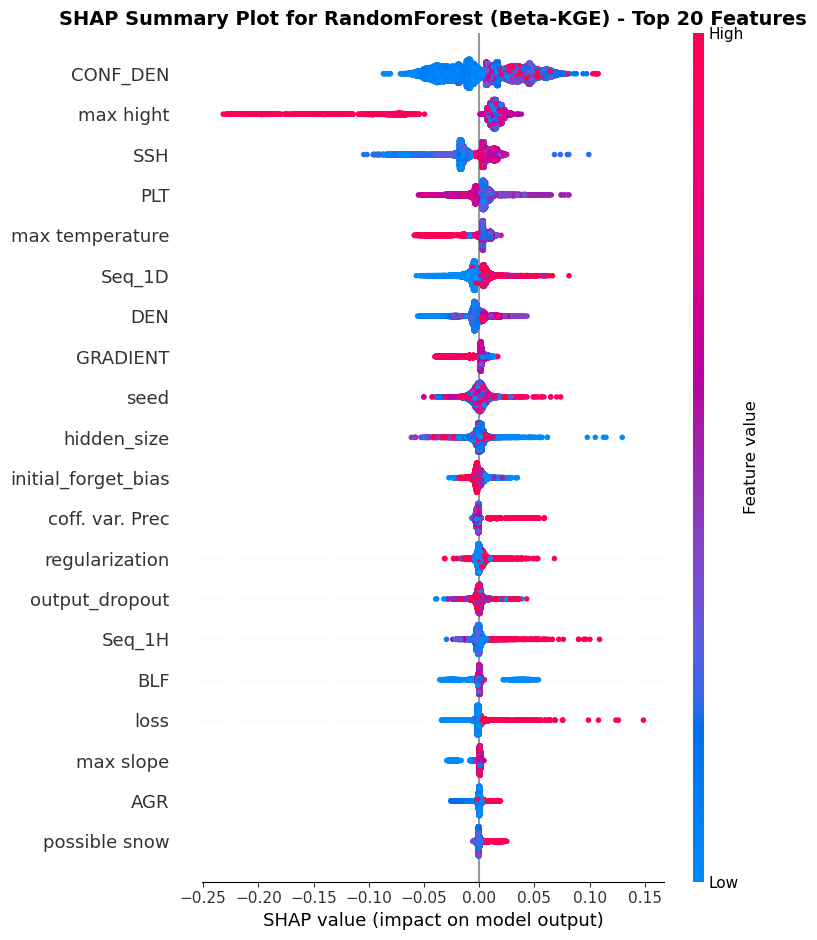

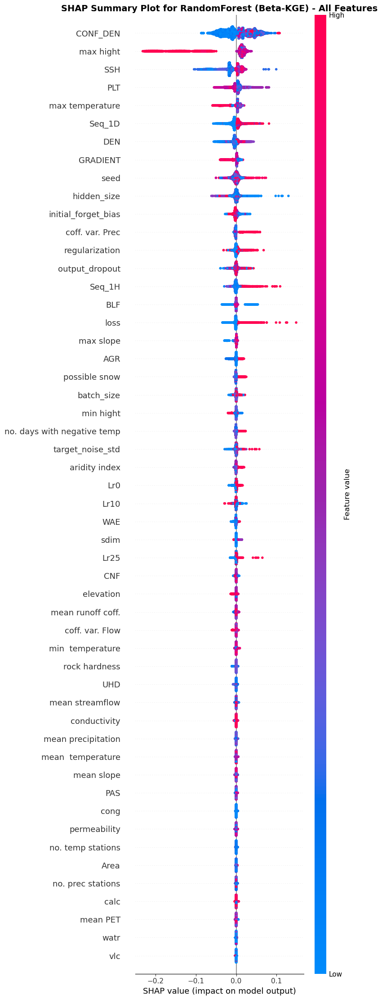

In [ ]:
## SHAP plots for Beta-KGE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'Beta-KGE'
rf=rf_models['Beta-KGE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

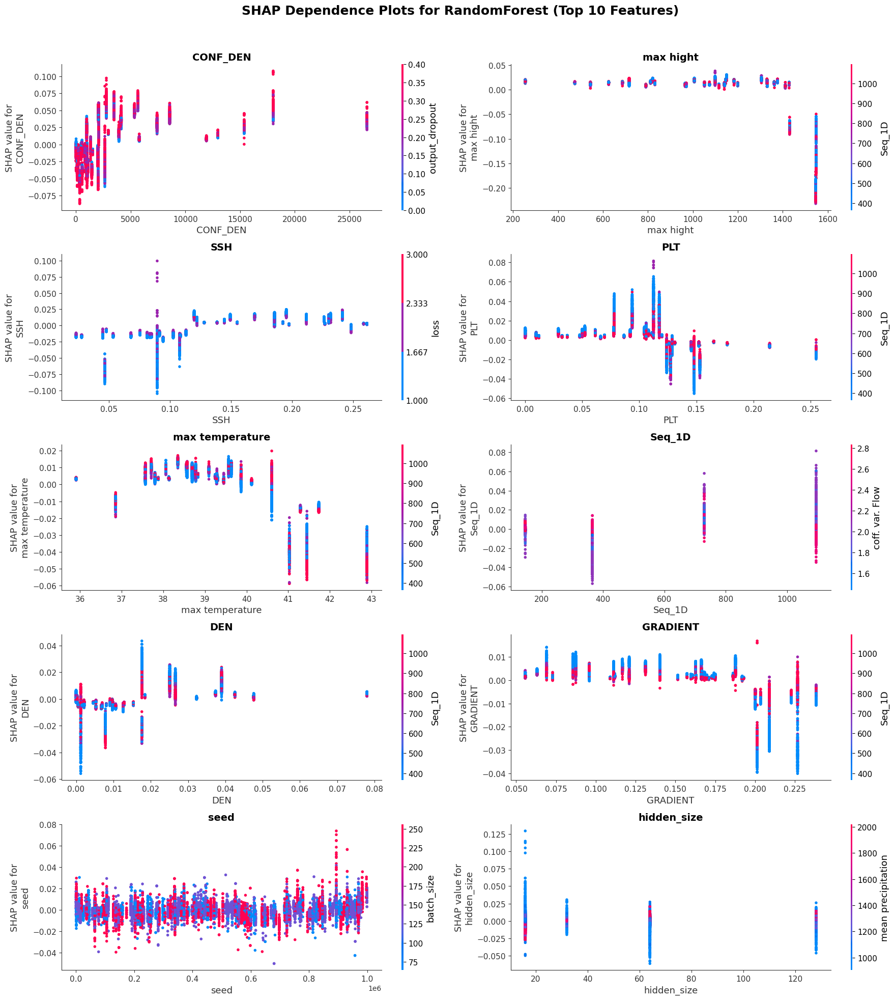

In [34]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

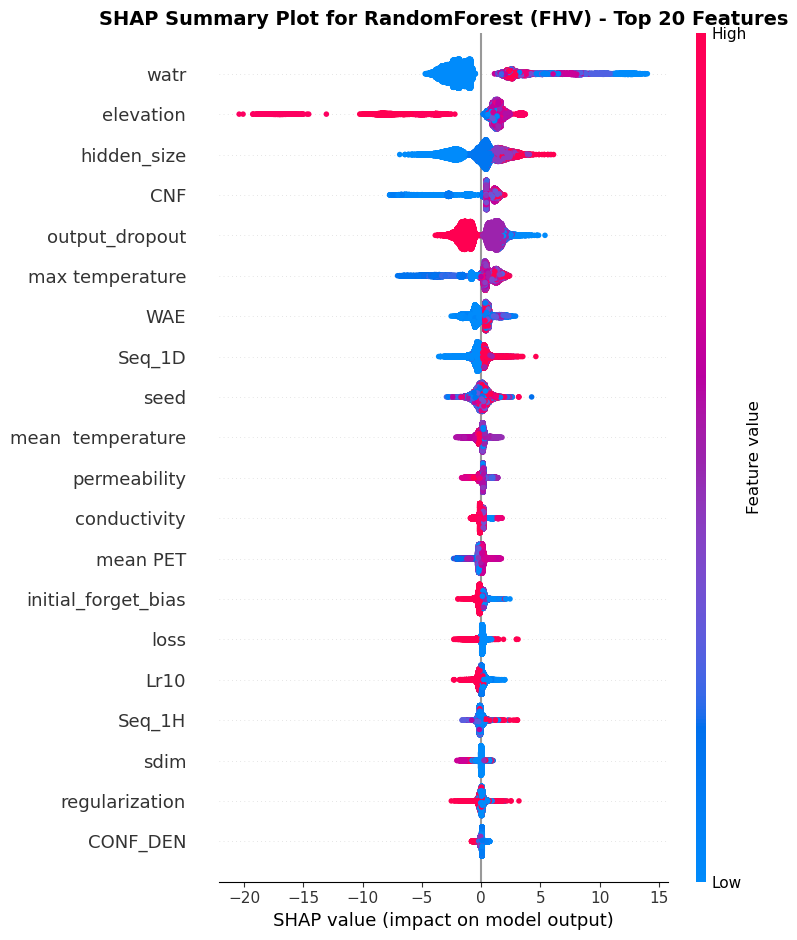

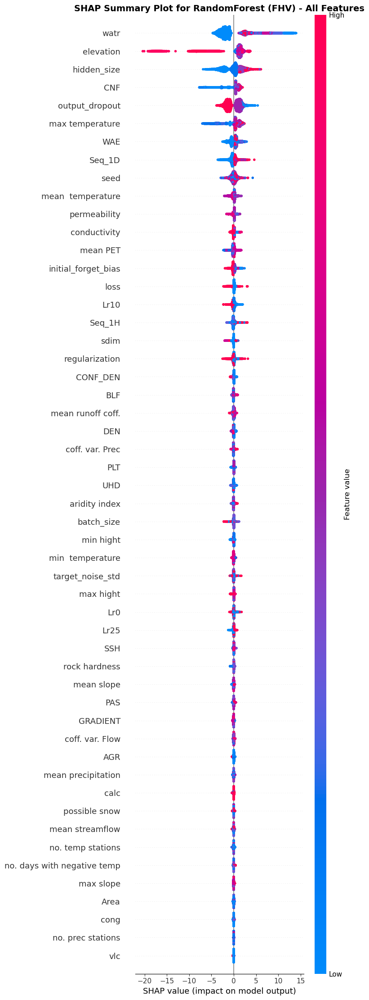

In [ ]:
## SHAP plots of FHV metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'FHV'
rf=rf_models['FHV']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

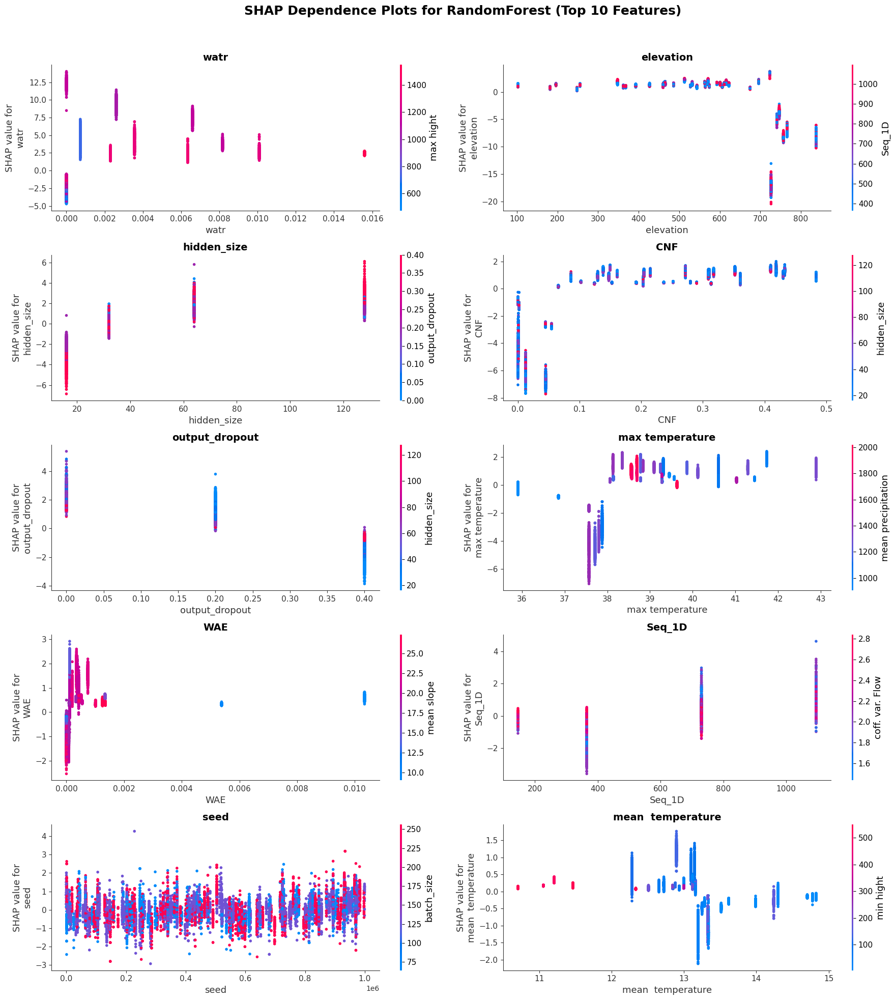

In [36]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

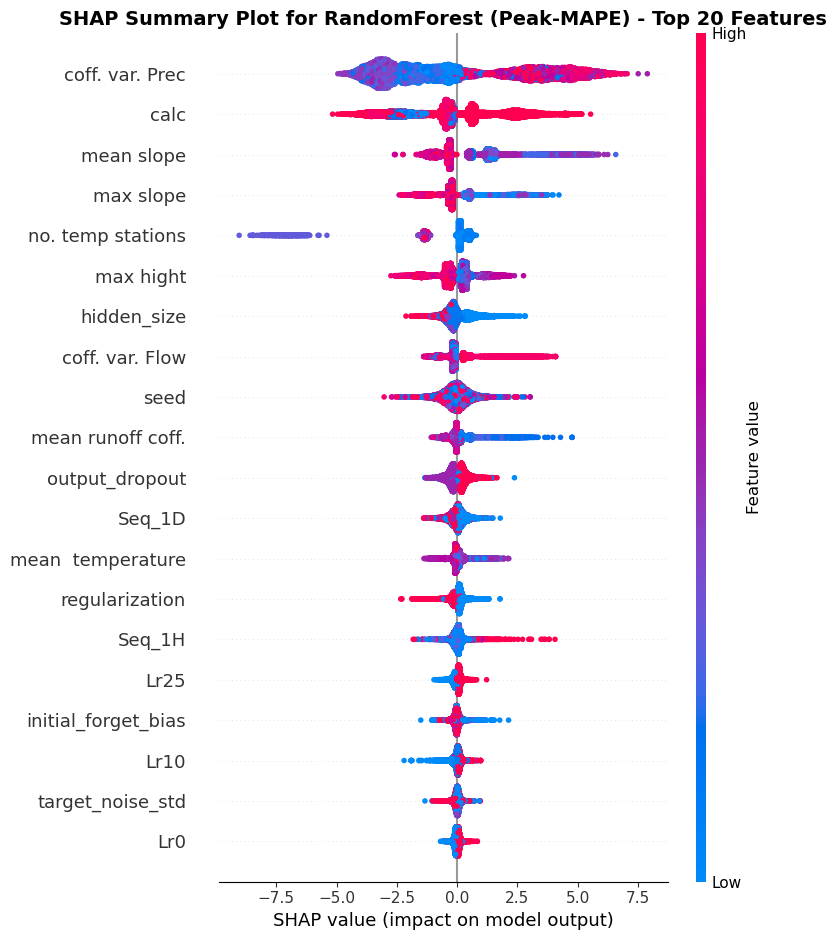

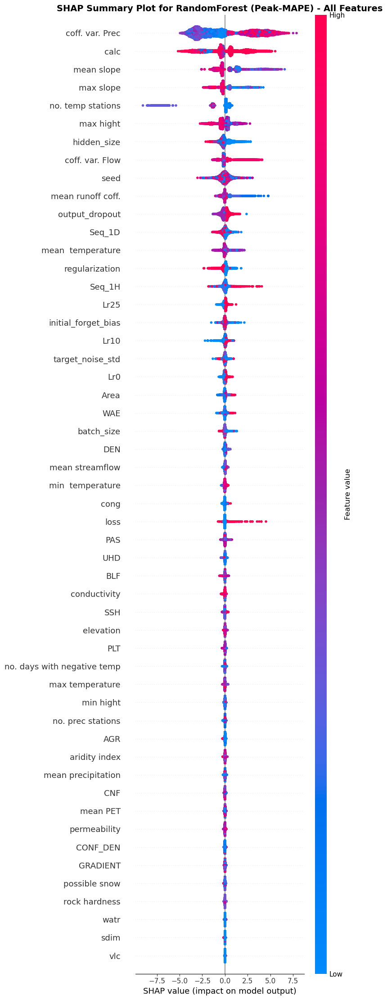

In [ ]:
## SHAP plots for Peak-MAPE metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'Peak-MAPE'
rf=rf_models['Peak-MAPE']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

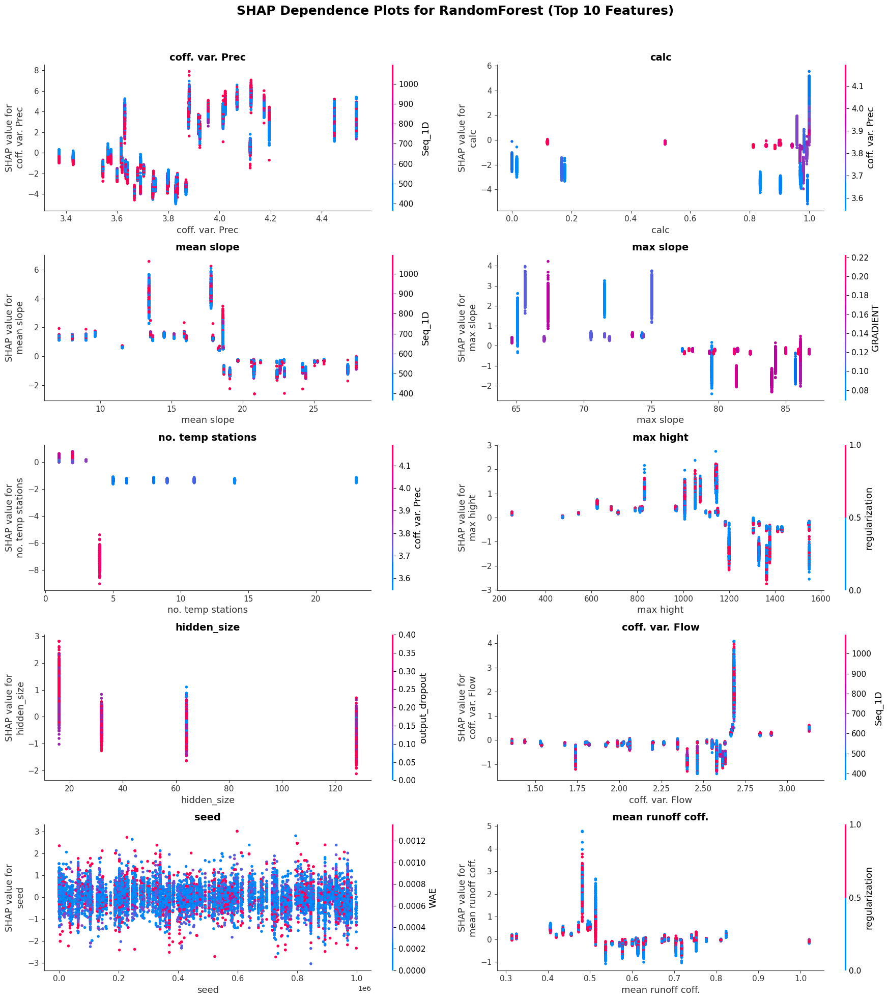

In [38]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

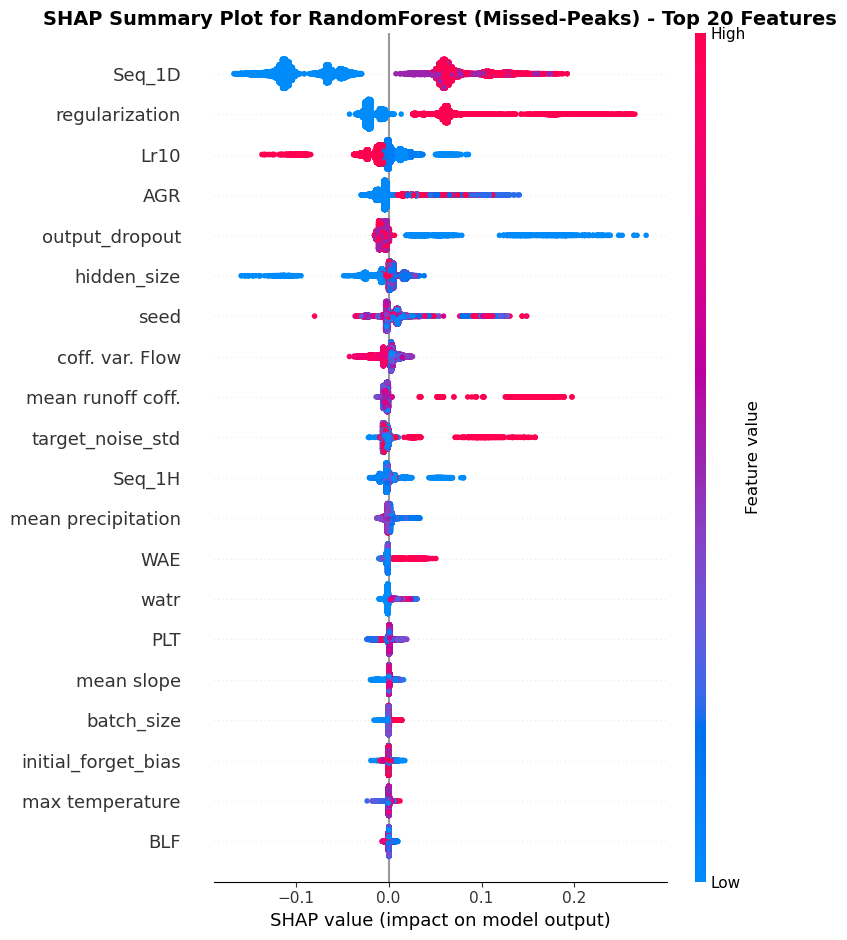

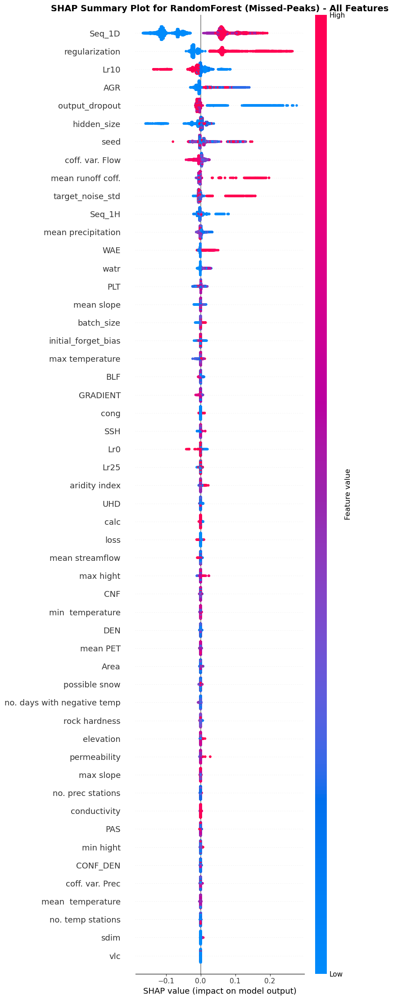

In [ ]:
## SHAP plots for Missed-Peaks metric

# Define the target variables
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']
var = 'Missed-Peaks'
rf=rf_models['Missed-Peaks']

# RandomForest: Explainer 
explainer_rf = shap.Explainer(rf)
shap_values_rf = explainer_rf(X_test)

feature_names = X_test.columns

# -------------------- Top 20 Features --------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False)
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - Top 20 Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Top20.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()


# -------------------- All Features --------------------
# Dynamic figure height based on the number of features (optional, to improve readability)
fig_height = min(20, len(feature_names) * 0.3)  # Adjust factor as needed (e.g., 0.3 or 0.4 for spacing)

plt.figure(figsize=(10, fig_height))
shap.summary_plot(shap_values_rf, X_test, feature_names=feature_names, show=False, max_display=len(feature_names))
plt.title(f"SHAP Summary Plot for RandomForest ({var}) - All Features", fontsize=14, fontweight='bold')
plt.tight_layout()

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_AllFeatures.tiff", dpi=300, format='tiff')

# Display the plot
plt.show()

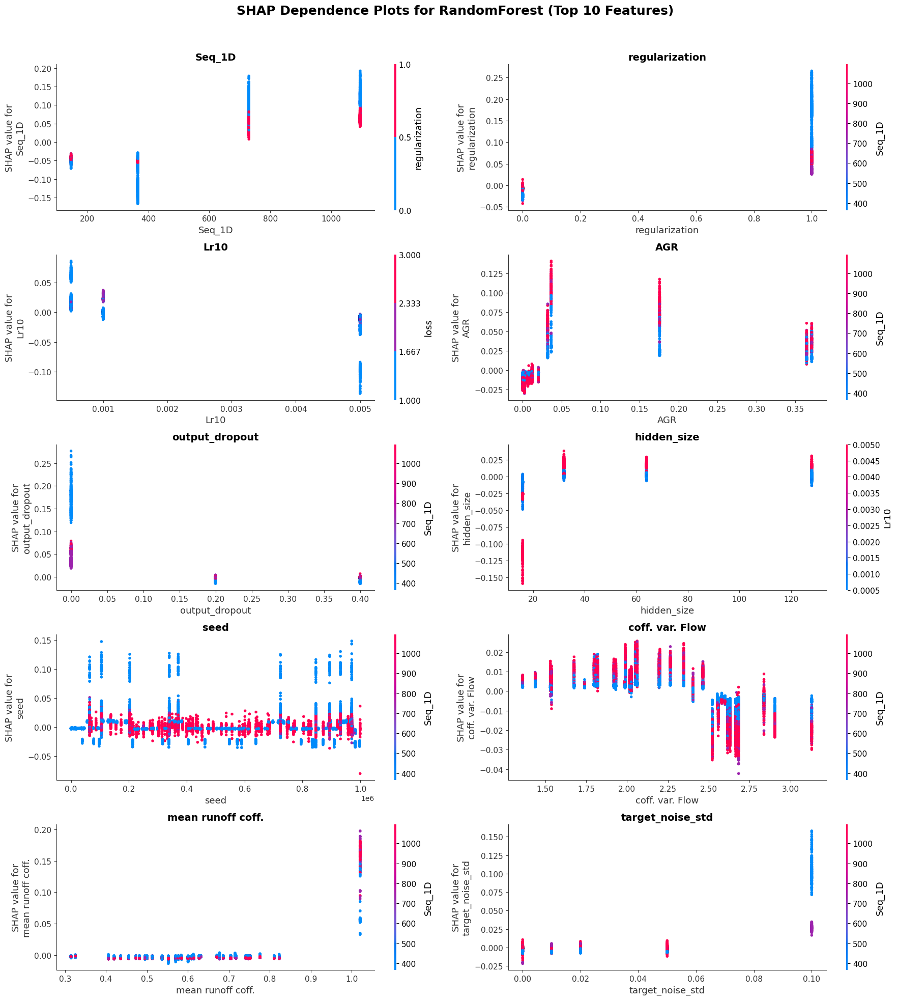

In [40]:
# --- Dependence Plots for Top 10 Features ---

# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values_rf.values).mean(axis=0)

# Get indices of top 10 important features
top_10_indices = np.argsort(mean_abs_shap)[::-1][:10]  # Sort descending and take top 10
top_10_features = feature_names[top_10_indices]  # Feature names for top 10

# Subplots for Dependence plots (arranged as 5 rows x 2 columns for better layout)
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
fig.suptitle("SHAP Dependence Plots for RandomForest (Top 10 Features)", fontsize=18, fontweight='bold')

# Plot each feature
for i, ax in enumerate(axes.flatten()):
    if i < len(top_10_features):  # To avoid index error in case fewer than 10
        shap.dependence_plot(
            top_10_features[i],  # Feature name
            shap_values_rf.values, 
            X_test, 
            ax=ax, 
            show=False
        )
        ax.set_title(f"{top_10_features[i]}", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle

# Save the figure
plt.savefig(results_dir / f"SHAP_{var}_Dependence.tiff", dpi=300, format='tiff')

plt.show()

In [ ]:
# code to combine 10 different SHAP plots in one for the paper

import os
from PIL import Image
import matplotlib.pyplot as plt

# Paths
input_dir = r'~\Results\SHAPs'
output_file = r'~\Results\SHAPplot.pdf'

# List of target variables in the required order
target_variables = ['NSE', 'KGE', 'RMSE', 'Alpha-NSE', 'Beta-NSE',
                    'Pearson-r', 'Beta-KGE', 'FHV', 'Peak-MAPE', 'Missed-Peaks']

# Create figure
fig, axs = plt.subplots(2, 5, figsize=(20, 8))  # Adjust figsize if needed
axs = axs.flatten()

# Loop over target variables and corresponding subplot axis
for idx, (var, ax) in enumerate(zip(target_variables, axs)):
    # Build file path
    file_path = os.path.join(input_dir, f'{var}.tiff')
    
    # Open image
    if os.path.exists(file_path):
        img = Image.open(file_path)
        ax.imshow(img)
        ax.set_title(var, fontsize=12)
        ax.axis('off')
    else:
        print(f"Warning: File {file_path} does not exist.")

# Adjust layout
plt.tight_layout()

# Save final figure
plt.savefig(output_file, dpi=300, format='pdf')
plt.close()

print(f"Saved combined SHAP plot at: {output_file}")


Saved combined SHAP plot at: D:\Thesis2024\Papers.OnGoing\Papers.UnderWork\Paper.03.Attributes&LSTMs.Hydrological.Understanding\Paper.Submission\Results\SHAPplot.pdf


In [16]:
## To create an average metrics column for the four targets for next tasks working on the avarage performance on all metrics

df2['mean_metrics'] = df2[['SF_NSE',	'SF_KGE']].mean(axis=1)
print(df.head())
print('===================')


   Seq_1D  Seq_1H  batch_size  target_noise_std    Lr0   Lr10   Lr25  loss  \
0     365     504          64              0.05  0.001  0.001  0.001     1   
1     365     504          64              0.05  0.001  0.001  0.001     1   
2     365     504          64              0.05  0.001  0.001  0.001     1   
3     365     504          64              0.05  0.001  0.001  0.001     1   
4     365     504          64              0.05  0.001  0.001  0.001     1   

   hidden_size  output_dropout  ...  aridity index  mean precipitation  \
0           32             0.2  ...       1.305248          741.690281   
1           32             0.2  ...       0.816274         1172.193311   
2           32             0.2  ...       0.768765         1218.851932   
3           32             0.2  ...       0.673414         1413.344490   
4           32             0.2  ...       0.654248         1421.334652   

   mean streamflow  mean  temperature min  temperature max temperature  \
0       241.

C:\Users\hosseinifh\AppData\Local\Temp\ipykernel_21920\3012451397.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['mean_metrics'] = df2[['SF_NSE',	'SF_KGE']].mean(axis=1)


Explained Variance Table:
   Component  Explained Variance Ratio  Cumulative Explained Variance
0          1                  0.256671                       0.256671
1          2                  0.167213                       0.423884
2          3                  0.147332                       0.571216
3          4                  0.089495                       0.660711
4          5                  0.052452                       0.713163
5          6                  0.047238                       0.760401
6          7                  0.039431                       0.799832
7          8                  0.032096                       0.831928
8          9                  0.024555                       0.856482
9         10                  0.021195                       0.877678


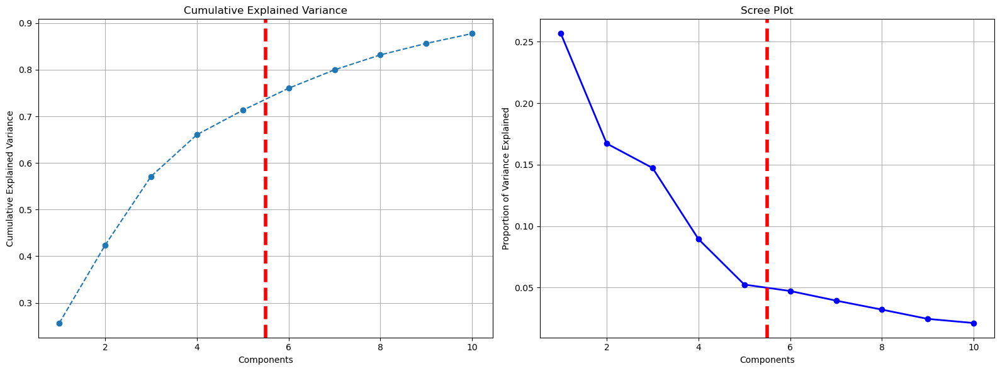

,PCA Component 1,PCA Component 2,PCA Component 3,PCA Component 4,PCA Component 5,PCA Component 6,PCA Component 7,PCA Component 8,PCA Component 9,PCA Component 10
Area,0.053673,0.203218,0.098973,0.354719,-0.246660,-0.060680,-0.053473,0.023530,0.065933,-0.036068
CONF_DEN,0.040260,0.243322,0.068381,0.344142,-0.156687,-0.054135,-0.018620,0.126960,0.058021,-0.100081
GRADIENT,-0.172295,0.224935,0.095771,-0.106403,-0.011092,-0.017785,-0.048147,-0.084418,0.255109,0.011735
max slope,-0.029553,0.234912,0.107764,0.117690,0.188058,0.247231,-0.020422,-0.046163,0.436673,-0.144002
mean slope,-0.231555,0.078828,0.197659,-0.140155,-0.094310,-0.079212,-0.136950,-0.036053,0.005960,0.006715
elevation,0.141674,0.100429,0.295087,-0.111772,0.109562,0.168875,0.007648,-0.109129,0.064090,-0.037516
min hight,0.255102,-0.048328,0.132820,-0.125971,0.119024,0.106737,0.117285,0.027354,-0.128181,-0.026484
max hight,0.083483,0.214409,0.284900,0.016030,0.083551,0.156553,-0.010684,-0.092087,0.111455,0.057062
UHD,0.019485,-0.184593,-0.247579,0.158366,-0.118822,0.189967,0.076445,0.052278,-0.050034,0.279488
AGR,0.252028,-0.108207,0.052586,0.007694,-0.081863,-0.119899,0.100956,-0.142837,-0.004514,0.025587


In [19]:
# To apply a PCA on  test_DATASET of the optimized Regional LSTMs on URA catchments

# Split data into training and testing sets for the current target variable
X_train, X_test, y_train, y_test = train_test_split(
    df2.drop(columns=['Seq_1D', 'Seq_1H', 'batch_size', 'target_noise_std', 'Lr0', 'Lr10',
       'Lr25', 'loss', 'hidden_size', 'output_dropout', 'initial_forget_bias',
       'regularization', 'seed', 'Model', 'basin', 'freq', 'SF_NSE', 
       'SF_NSE',	'SF_KGE',	
        'SF_RMSE',	'SF_Alpha-NSE',	'SF_Beta-NSE',	
        'SF_Pearson-r',	'SF_Beta-KGE',	'SF_FHV',	
        'SF_Peak-MAPE',	'SF_Missed-Peaks', 'Config', 'BasinCode', 'mean_metrics']).astype(float), 
    df2['mean_metrics'], 
    test_size=0.3, 
    random_state=42
)

# Select features for PCA
features_for_pca = X_train.columns

# Extract the selected features from the DataFrame
df_selected = X_train[features_for_pca]

# Standardize the data
scaler = StandardScaler()
df_standardized = scaler.fit_transform(df_selected)

# Specify the number of components to keep
n_components = 10

# Instantiate PCA object and fit to data
pca = PCA(n_components=n_components)
pca.fit(df_standardized)

# Transform data to new reduced dimensions
df_pca = pca.transform(df_standardized)

# Check explained variance for each component
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)
# Assuming df is your original DataFrame
# feature_names = ['Seq_1D', 'Seq_1H', 'hidden_size', 'batch_size', 'initial_forget_bias', 'regularization', 'loss', 'output_dropout']

# Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot cumulative explained variance
axes[0].plot(range(1, n_components + 1), cumulative_explained_variance, marker='o', linestyle='--')
axes[0].set_title('Cumulative Explained Variance')
axes[0].set_xlabel('Components')
axes[0].set_ylabel('Cumulative Explained Variance')
axes[0].grid(True)
axes[0].axvline(linewidth=4, color='r', linestyle='--', x=5.5, ymin=0, ymax=1)

# Plot Scree plot
axes[1].plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, 'bo-', linewidth=2)
axes[1].set_xlabel('Components')
axes[1].set_ylabel('Proportion of Variance Explained')
axes[1].set_title('Scree Plot')
axes[1].grid(True)
axes[1].axvline(linewidth=4, color='r', linestyle='--', x=5.5, ymin=0, ymax=1)

# Display the explained variance ratio for each component in a table
explained_variance_table = pd.DataFrame({
    'Component': np.arange(1, pca.n_components_ + 1),
    'Explained Variance Ratio': pca.explained_variance_ratio_,
    'Cumulative Explained Variance': np.cumsum(pca.explained_variance_ratio_)
})
print("Explained Variance Table:")
print(explained_variance_table)

# Display the explained variance ratio for each component in a table
evr = pca.explained_variance_ratio_
cvr = np.cumsum(pca.explained_variance_ratio_)
pca_df = pd.DataFrame()
pca_df['Cumulative Variance Ratio'] = cvr
pca_df['Explained Variance Ratio'] = evr

# Adjust layout for better appearance
plt.tight_layout()

# Save the figure as a high-quality TIFF file
plt.savefig(results_dir / 'PCA.pdf', dpi=300, format='pdf')

# Show the combined plot
plt.show()

# Explained variance ratio for each principal component
explained_variance_ratio = pca.explained_variance_ratio_

# Create PCA dimension labels
pca_dims = ['PCA Component {}'.format(x + 1) for x in range(len(pca_df))]

# Create a DataFrame to hold PCA components, explained variance, and cumulative variance
pca_test_df = pd.DataFrame(pca.components_, columns=X_train.columns, index=pca_dims)

# Add the explained variance and cumulative variance to the DataFrame
pca_test_df['Explained Variance Ratio'] = explained_variance_ratio
pca_test_df['Cumulative Variance'] = np.cumsum(explained_variance_ratio)

# Save the DataFrame to an Excel file in the specified directory
output_file = results_dir / 'PCA.xlsx'
pca_test_df.to_excel(output_file)

# Display the first 30 components (transpose to see features in columns)
pca_test_df.head(30).T

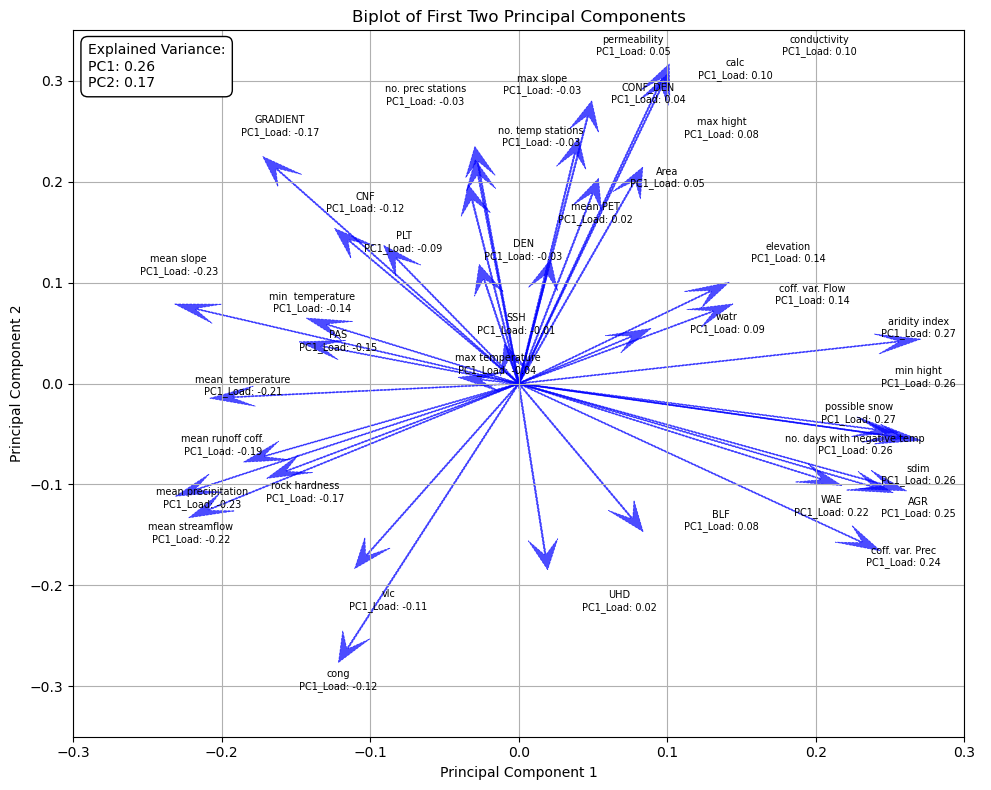

In [33]:
# To apply a PCA on  test_DATASET of the optimized Regional LSTMs on URA catchments

# Create a biplot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot arrows for each feature
for i in range(39):
    ax.arrow(0, 0, pca.components_[0, i], pca.components_[1, i], head_width=0.02, head_length=0.03, color='blue', length_includes_head=True,
             linestyle='dashed', linewidth=0.5, alpha=0.7, overhang=0.5)

# Annotate points with labels
texts = []
for i in range(39):
    random_offset_x = np.random.uniform(-0.02, 0.02)
    random_offset_y = np.random.uniform(-0.02, 0.02)
    
    # Bold text
    text = ax.text(pca.components_[0, i] * 1.15 + random_offset_x, pca.components_[1, i] * 1.15 + random_offset_y,
                   f'{df_selected.columns[i]}\nPC1_Load: {pca.components_[0, i]:.2f}',
                   color='black', fontsize=7)
    texts.append(text)

# Adjust text positions to avoid overlap
adjust_text(texts, arrowprops=dict(arrowstyle="-", color='black', lw=0), force_text=1.5, expand_points=(1, 1))

ax.set_xlim(-0.3, 0.3)
ax.set_ylim(-0.35, 0.35)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('Biplot of First Two Principal Components')
ax.grid()

# Add a text box for explained variance inside the plot
trans = blended_transform_factory(ax.transData, ax.transAxes)
text_box = f'Explained Variance:\nPC1: {pca.explained_variance_ratio_[0]:.2f}\nPC2: {pca.explained_variance_ratio_[1]:.2f}'
ax.text(-0.29, 0.92, text_box, transform=trans, fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

# Adjust layout for better appearance
plt.tight_layout()

# Save the figure as a high-quality TIFF file
plt.savefig(results_dir / 'PCA_Biplot.pdf', dpi=300, format='pdf')

# Show the combined plot
plt.show()
